In [1]:
from keras.models import load_model

好像只有 `.h5` 类型的模型文件可以加载，最新的 `.keras` 类型无法加载。

In [6]:
model = load_model('/Users/bifnudozhao/Projects/ai-playground/results/cats_and_dogs_small_augmentation.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 128)       0

## 激活图可视化

In [7]:
img_path = '/Users/bifnudozhao/Projects/ai-playground/datasets/train/cats/cat.4.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 150, 150, 3)


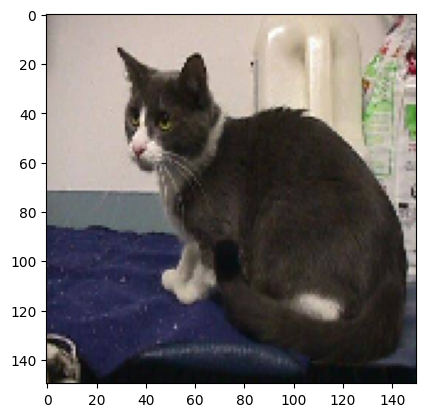

In [8]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [9]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

2023-10-01 23:21:10.279844: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 570ms/step


In [10]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


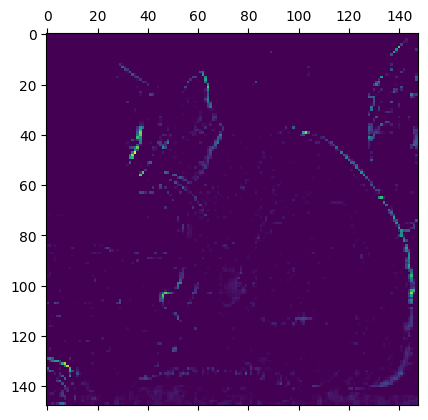

In [14]:
plt.matshow(first_layer_activation[0, :, :, 8], cmap='viridis')

/var/folders/63/hmm24s352qv_4vs09n66p97m0000gn/T/ipykernel_70016/3475131881.py:22: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
/var/folders/63/hmm24s352qv_4vs09n66p97m0000gn/T/ipykernel_70016/3475131881.py:25: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


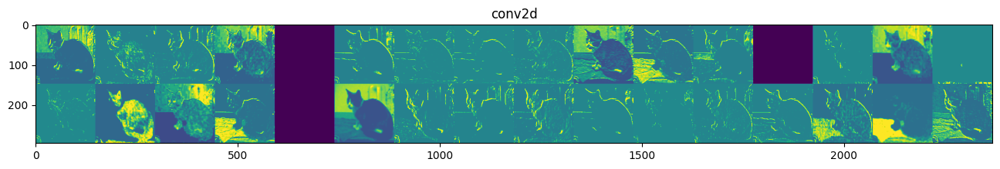

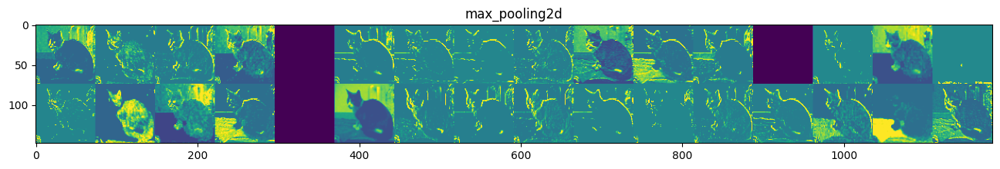

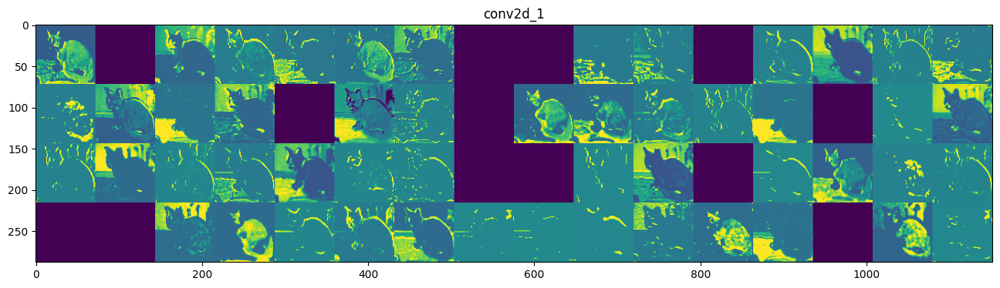

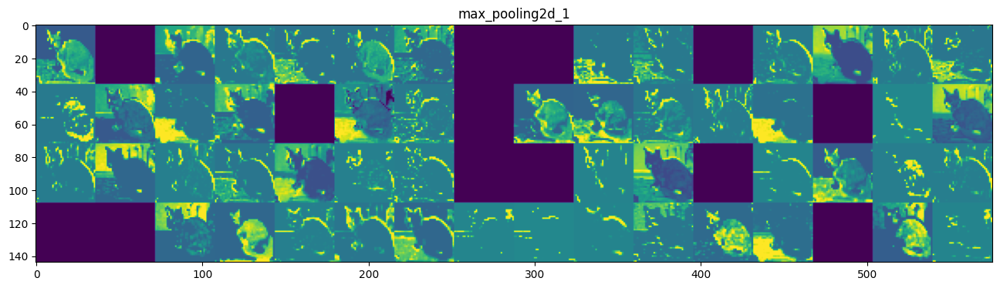

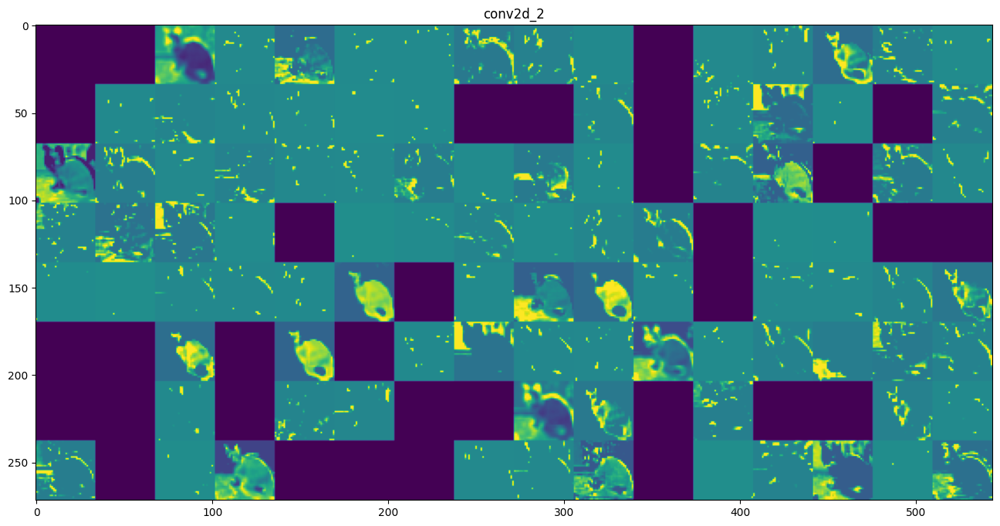

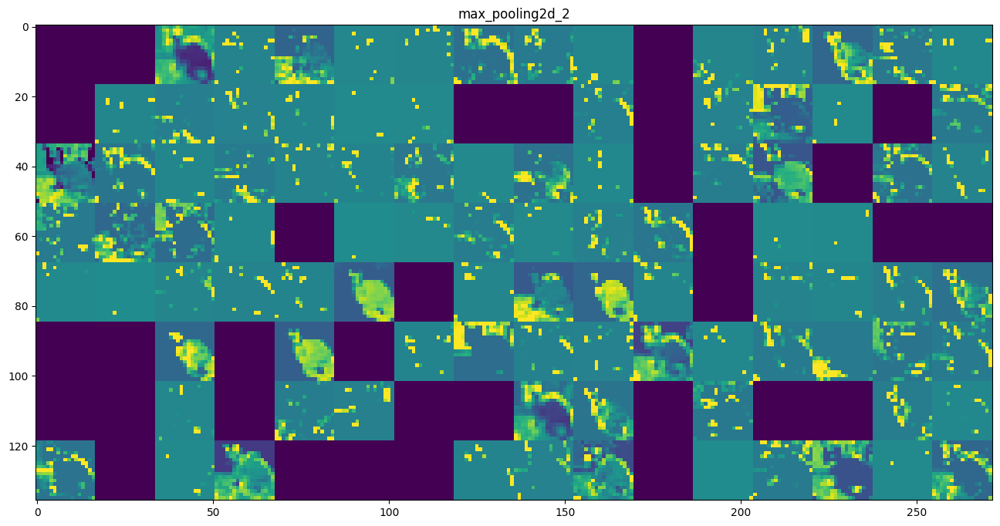

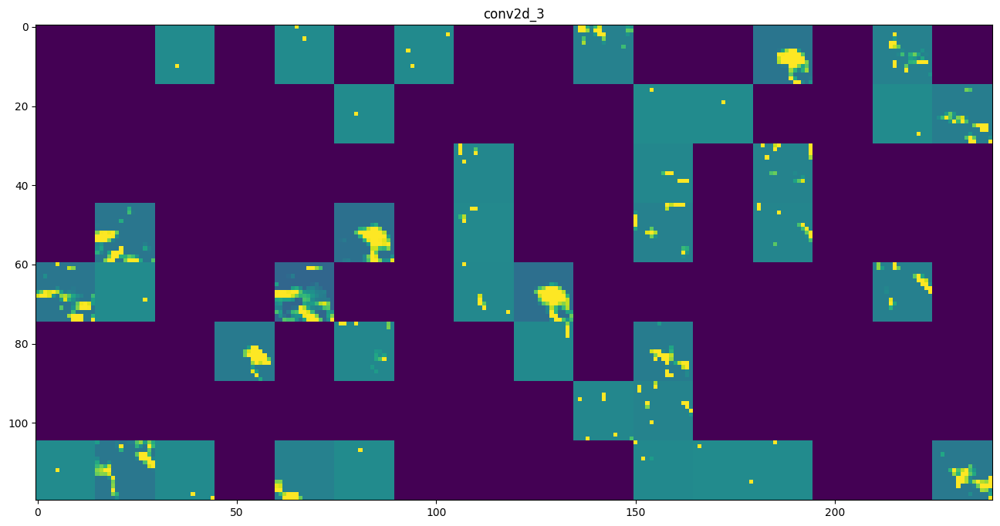

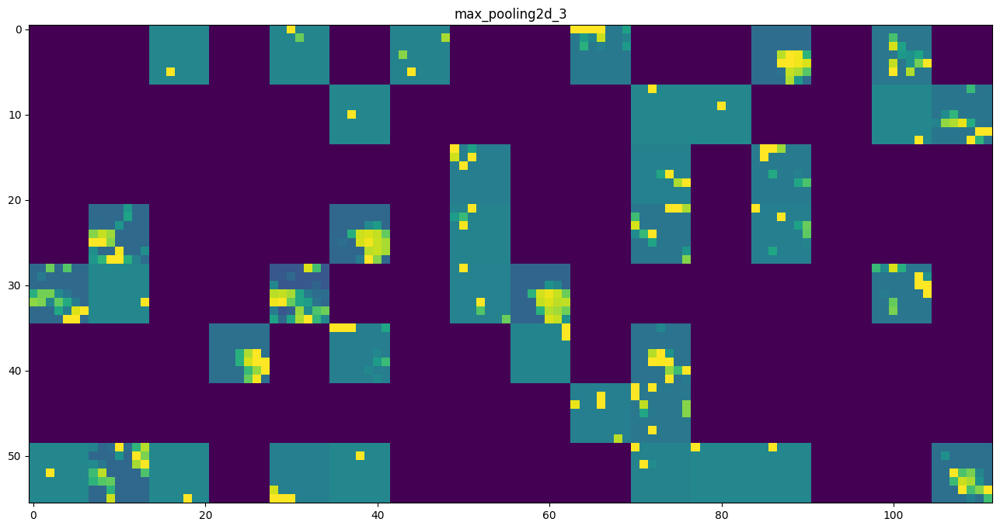

In [16]:
layer_names = []

for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    # feature map has shape (1, size, size, n_features)
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image
            
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

从上面的激活图可以看到

- 第一层可以看成是边缘检测，激活图基本保留了原图的一些特征。
- 随着层数加深，每个激活图都有一定程度的倾向性，比如有些对猫头，有些对猫尾，有些对猫耳朵响应特别强，由此看出，不同层里的卷积作用开始出现分化，分别识别图片主体的不同部分。
- 随着层数的加深，响应图的数量也逐渐减少，这意味着某些过滤器对这个输入图没有响应。

## 过滤器可视化

过滤器可视化实际上是看看神经网络从输入学到了什么，这个学习的过程，是从一个随机初始化的参数开始的，如果想看学到了什么，那么可以对一个已经训练完的网络进行反向操作，这意味着，给网络输入一个随机的灰度图片，然后通过反向传播看这个网络对这个输入做出的响应来看出，网络究竟学到了什么。

In [41]:
import numpy as np
from keras.applications import VGG16
from keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet', include_top=False)


2023-10-02 13:53:39.191424: W tensorflow/c/c_api.cc:305] Operation '{name:'block4_conv1_2/kernel/Assign' id:17727 op device:{requested: '', assigned: ''} def:{{{node block4_conv1_2/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](block4_conv1_2/kernel, block4_conv1_2/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


In [52]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    x += 0.5
    x = np.clip(x, 0, 1)

    return x

In [53]:
def generate_pattern(layer_name, filter_index, size=150):
    # 抽取出想要观察的层
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # 手动计算梯度并将其标准化
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # 构造一个迭代函数
    iterate = K.function([model.input], [loss, grads])
    # 构造一个随机的灰度图片，带有一点噪声
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # 进行随机梯度下降
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    return deprocess_image(img)

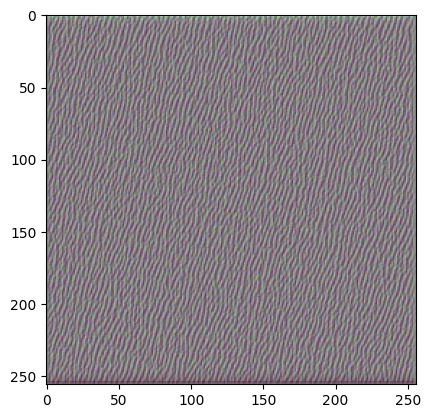

In [54]:
img = generate_pattern('block2_conv1', 15, 256)
plt.imshow(img)
plt.show()

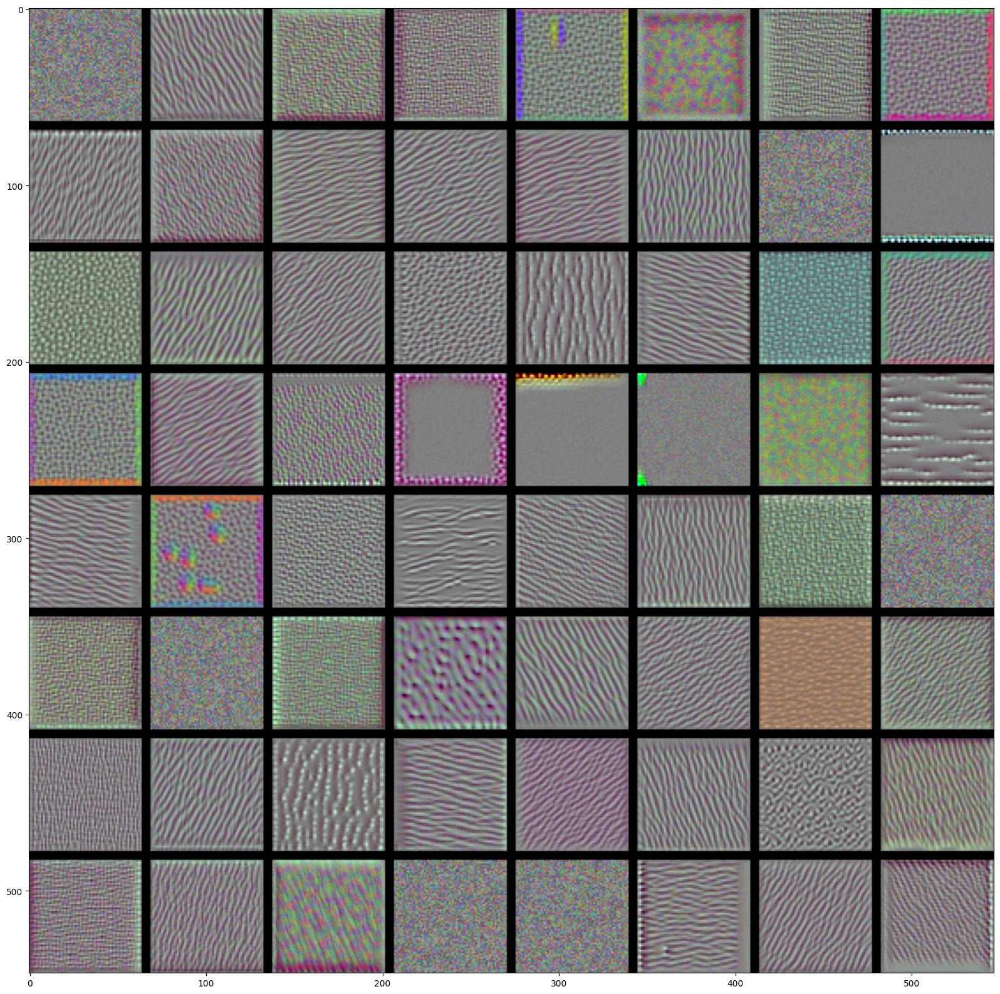

In [55]:
layer_name = 'block1_conv1'

def generate_pattern_by_layer_name(layer_name):
    size = 64
    margin = 5

    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start:horizontal_end,
                    vertical_start:vertical_end, :] = filter_img

    plt.figure(figsize=(20, 20))
    plt.imshow(results)

generate_pattern_by_layer_name('block2_conv1')

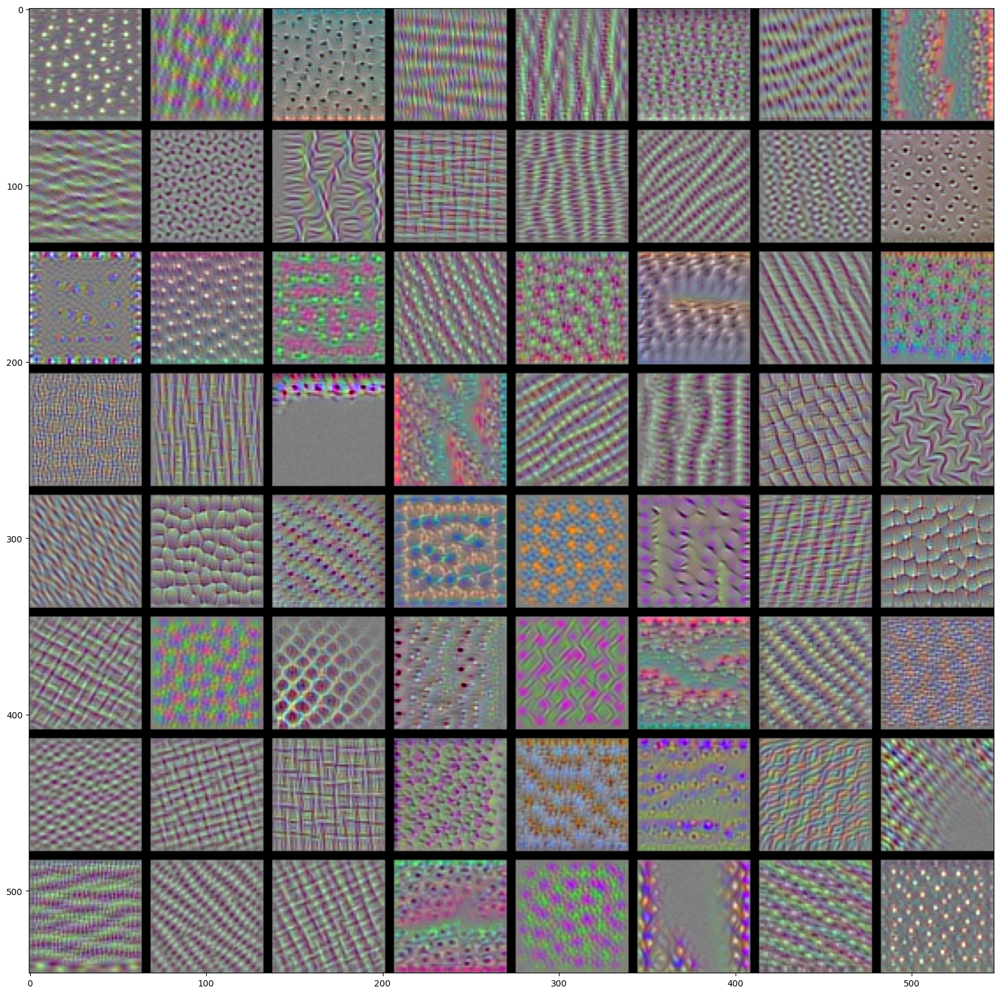

In [56]:
generate_pattern_by_layer_name('block3_conv1')

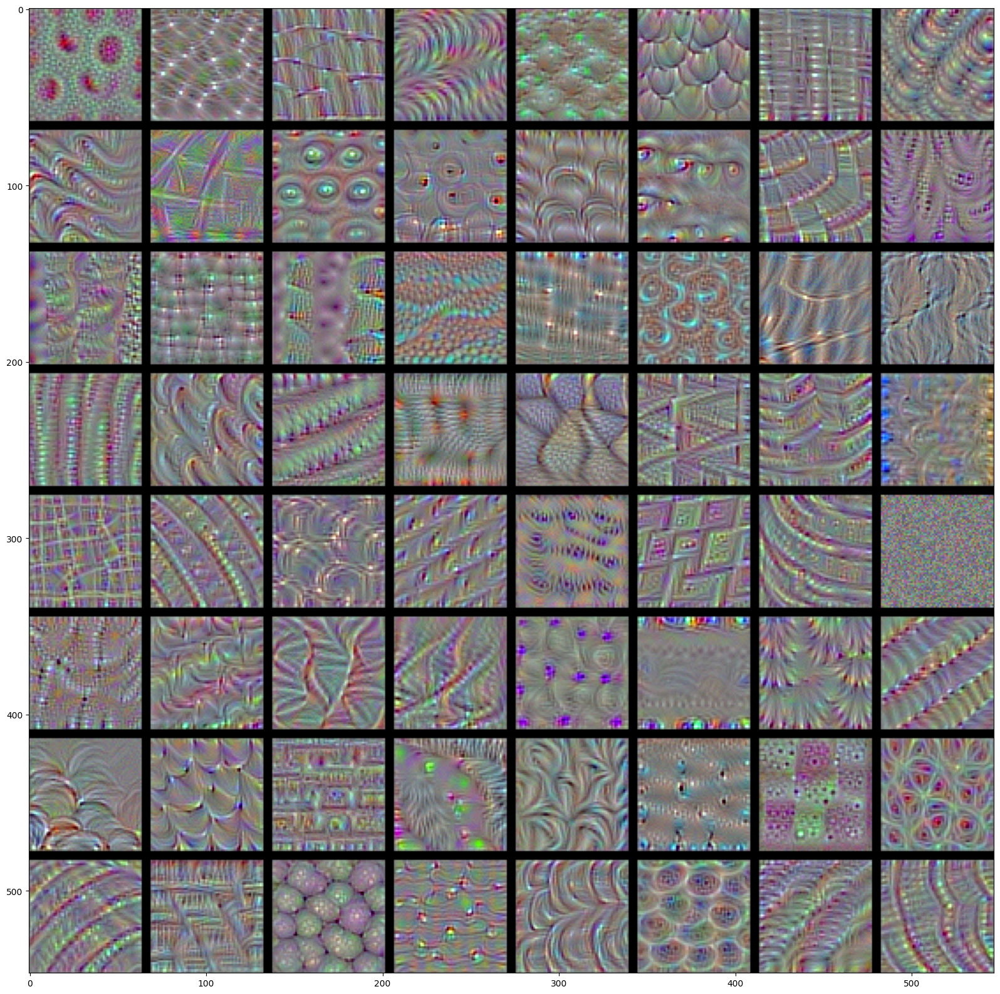

In [57]:
generate_pattern_by_layer_name('block4_conv1')